Based on the `bleier_scholger_tm_basic.ipynb` from the [clariah2025-dse-ml repository](https://github.com/DHGraz/clariah2025-dse-ml).

# **Introduction to BERTopic**

This notebook relies on the BERTopic documentation and notebooks provided by Maarten Grootendorst. For further documentation please consult the [BERTopic Website](https://maartengr.github.io/BERTopic/index.html) or have a look at this [youtube video](https://www.youtube.com/watch?v=uZxQz87lb84).  

BERTopic is a flexible topic modeling framework that allows users to create customized topic models that can handle various use cases. With its ability to switch compontents it allows also to integrate latest developments in AI (e.g. generative AI for Topic Labeling).

The difference to LDA for example is that it can embed documents before finding topic clusters, and it generates the number of topics automatically, which you have to specify in advance in most TM algorithms.

![LDA vs. BERTopic](<LDA vs. BERTopic.png>)

## **What is BERT?**

BERT = Bidirectional Encoder Representations from Transformers

BERT is designed to understand the context of words in a sentence by looking at both the words before and after a given word, hence the term "bidirectional." This allows BERT to grasp the meaning of a word based on its surroundings, leading to better comprehension of language nuances. It can be used for Topic Modeling, Sentiment Analysis, Question-Answering, Summarization, Named Entity Recognition etc.

BERT was introduced in 2018 by Google AI Language (see [Devlin 2018](https://arxiv.org/abs/1810.04805)).

It uses a transformer architecture, which relies on attention mechanisms to weigh the importance of different words in a sentence (see [Vaswani et al. 2017](https://arxiv.org/abs/1706.03762))

The input is a sequence of tokens, which are first embedded into vectors (that means that textual data is converted into a numerical representation that can be processed by machine learning models) and then processed in the neural network. The output is a sequence of vectors in which each vector corresponds to an input token with the same index.


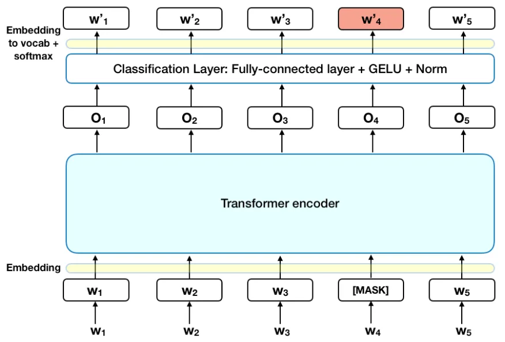


To get started, run the code below to mount your google drive in the notebook, which makes sure you will have access to the files in the folder you copied.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
%cd /content/drive/MyDrive/dse-ml-2026/materials/2026-09-22_tuesday/07_wolff_bertopic_pipeline/

Check for updates

In [ ]:
#!git pull

# **A minimal BERTopic pipeline**


## **Installation**

Before preparing the data, we install **bertopic** with sentence-transformers from [pypi](https://pypi.org/project/bertopic/) before preparing the data.

**NOTE**: Make sure to select a GPU runtime. Otherwise, the model can take quite some time to create the document embeddings!

In [ ]:
!pip install bertopic

In [6]:
from bertopic import BERTopic
import pandas as pd

For this minimal BERTopic pipeline we will be using the **DH Conference Abstracts Corpus, 2005–2026** - 6,291 paper/poster/panel records from the ADHO Digital Humanities conferences, spanning every year 2005–2026 except 2021 (no conference that year). Each row has `title`, `author`, `abstract`, `keywords`, `topics`, `type`, `bibliography`, `year` and `language` (fieldcompleteness varies by year depending on what each original source actually provided).

In [ ]:
# load the dataset
df = pd.read_csv(r'../../materials/datasets/dh_abstracts/dh2005-2026.csv')

In [3]:
df.info() # display summary information about the dataframe
df.head() # display the first few rows of the dataframe

NameError: name 'df' is not defined

For topic modeling we will analyze the abstract texts. For that we only need the content of the `abstract` column. We also need to make sure we are not taking any empty cells (`df.abstract.notnull()==True`) and we will also only consider the abstracts in Enlgish (`(df.language =='en')`).

In [9]:
documents = df[(df.abstract.notnull()==True) & (df.language =='en')].abstract.to_list() # filter for non-null abstracts in English
documents[5] # display the sixth document in the filtered list

"In 1996, when I first began work on the Internet Shakespeare Editions, I chose to describe my role as that of 'Coordinating Editor' rather than the more usual 'General Editor'. Coordination and collaboration are necessarily at the centre of the development of a major scholarly site that involves both academic and technical organization. Academically, there is an Editorial Board to oversee general standards, a General Textual Editor to crack the whip, and an extensive team of editors, since each play is being edited by one or more scholars. On the technical side the demands are no less complex. Gone are the days that a scholar can, as a sideline, whip up some reasonably effective HTML code and publish it; Web users now expect attractive, professionally designed pages, intuitive navigation, and full searching capabilities. In addition, sites are increasingly being generated from centralized relational databases requiring sophisticated programming skills. All this costs money, and it is 

## **Creating Topics**
We create the `topic_model` by instantiating the class constructor `BERTopic class` that creates a BERTopic object and pass some parameters.

We could select "multilingual" for the documents if we would have taken all the languages into consideration. Since we only have English texts, we can use `english`. `verbose=True` loggging tracks the progress and operations of the model, so we can see what is happening in the output.

The default embedding model is `all-MiniLM-L6-v2` when selecting `language="english"` and `paraphrase-multilingual-MiniLM-L12-v2` when selecting `language="multilingual"`.

For an overview of the parameters of `BERTopic`, see: https://maartengr.github.io/BERTopic/api/bertopic.html

In [54]:
topic_model = BERTopic(verbose=True, language="english")

We now generate the topics and their probabilities. `fit` trains the topic model on the provided data and `transform` transforms the input data into topic assignments (`topics`) and probabilities (`probs`).


In [55]:
topics, probs = topic_model.fit_transform(documents)

2026-09-17 15:42:54,065 - BERTopic - Embedding - Transforming documents to embeddings.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Batches:   0%|          | 0/189 [00:00<?, ?it/s]

2026-09-17 15:45:04,552 - BERTopic - Embedding - Completed ✓
2026-09-17 15:45:04,553 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-09-17 15:45:05,885 - BERTopic - Dimensionality - Completed ✓
2026-09-17 15:45:05,887 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-09-17 15:45:06,077 - BERTopic - Cluster - Completed ✓
2026-09-17 15:45:06,082 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-09-17 15:45:10,661 - BERTopic - Representation - Completed ✓


Remember what an embedding is? Embedding is converting textual data into a numerical representation that can be processed by machine learning models.

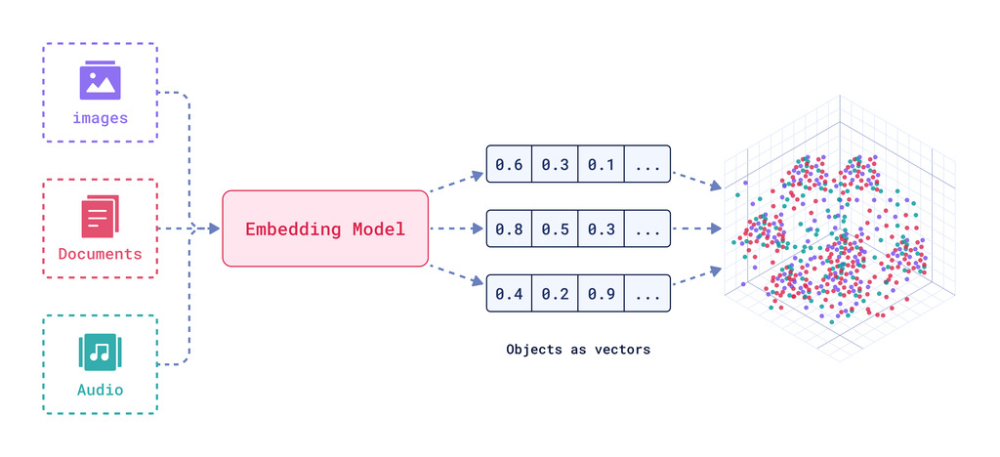

Image Source: https://qdrant.tech/articles/what-are-embeddings/

----- 



## **Looking into the topics**

Once the topics and probabilities are generated, we can start investigating the results:

We will use the method `get_topic_info()` to get information about the topics, it returns a table: one row per topic, several columns describing that topic. Here's what each column holds:

- **Topic**: holds the integer ID BERTopic assigned to each cluster, e.g. `0`, `1`, `2`, etc. Note that one value is particular: `-1`. `-1` does not represent a topic, it is the identifier of the the bucket for outlier documents that the clustering step (e.g., HDBSCAN) couldn't confidently place in any dense cluster. 

- **Count**: represents the cluster's size, i.e. how many documents ended up in that topic. Note that -1 frequently has a large count too, since it's "everything that didn't fit anywhere else."

- **Name**: holds an auto-generated label built from the topic ID plus its top keywords, e.g. `7_tei_xml_markup_document`.

- **Representation**: shows the ranked list of top keywords for that topic, scored by **c-TF-IDF** (class-based TF-IDF). Ordinary TF-IDF scores how distinctive a word is within one document relative to the whole corpus; c-TF-IDF does the same thing but treats an entire topic cluster as if it were one merged document, so it surfaces words that are distinctive of that cluster compared to all the other clusters.

- **Representative_Docs**: holds a short list of actual documents (usually 3) whose embeddings sit closest to the center of that topic's cluster. This can be interpreted as the top-n representative documents for that cluster.

_note that we use cluster and topics as interchangeable concepts, because the topics are identified by finding clusters in the dataset._

In [56]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,2761,-1_the_and_of_to,"[the, and, of, to, in, for, is, as, that, with]","[The theme of this conference is complexities,..."
1,0,141,0_tei_xml_markup_the,"[tei, xml, markup, the, for, to, document, is,...",[The Shakespeare Quartos Archive will make ava...
2,1,125,1_authorship_words_attribution_delta,"[authorship, words, attribution, delta, author...",[In the house of non-traditional authorship at...
3,2,117,2_image_visual_images_the,"[image, visual, images, the, of, and, al, et, ...",[Image analysis is increasingly central to the...
4,3,107,3_poetry_poems_poetic_rhyme,"[poetry, poems, poetic, rhyme, poem, of, the, ...","[To date, most studies that foreground quantit..."
...,...,...,...,...,...
91,90,11,90_computing_busa_computers_history,"[computing, busa, computers, history, humaniti...",[How can digital methods be used to conceptual...
92,91,11,91_dh_humanities_lab_as,"[dh, humanities, lab, as, digital, and, of, in...",[Panel Abstract Recent years have seen humanit...
93,92,10,92_climate_environmental_crisis_and,"[climate, environmental, crisis, and, humaniti...",[The digital is material; it also requires inf...
94,93,10,93_humanities_digital_dh_global,"[humanities, digital, dh, global, spain, commu...",[Autnoma de Mexico 1. Introduction Digital Hum...


In [57]:
# we can also get the topics for a specific topic id
topic_model.get_topic(7)

[('3d', np.float64(0.029550918872926154)),
 ('vr', np.float64(0.015259106827820274)),
 ('virtual', np.float64(0.013956298452927644)),
 ('and', np.float64(0.010904362733636899)),
 ('to', np.float64(0.009193152635124881)),
 ('reality', np.float64(0.009188423945014046)),
 ('the', np.float64(0.009033410445938467)),
 ('for', np.float64(0.008363368597214298)),
 ('of', np.float64(0.008333425171541457)),
 ('in', np.float64(0.007908495138529318))]

## **Visualizing**
BERTopic also has a couple viszalization methods built in.

In [58]:
# visualize the topics in an interactive visualization
topic_model.visualize_topics()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'customdata': array([[0, 'tei | xml | markup | the | for', 141],
                                   [1, 'authorship | words | attribution | delta | authors', 125],
                                   [2, 'image | visual | images | the | of', 117],
                                   ...,
                                   [92, 'climate | environmental | crisis | and | humanities', 10],
                                   [93, 'humanities | digital | dh | global | spain', 10],
                                   [94, 'word | embeddings | vectors | embedding | semantic', 10]],
                                  shape=(95, 3), dtype=object),
              'hovertemplate': '<b>Topic %{customdata[0]}</b><br>%{customdata[1]}<br>Size: %{customdata[2]}',
              'legendgroup': '',
              'marker': {'color': '#B0BEC5',
                         'line': {'color': 'DarkSlateGrey', 'width': 2},
                         'size': {'bdata': ('jQB9AHUAawBcAFwAXABbAFoARQBDAD' ... 'AMAAwADAAMAAwACwALAAoACgAKAA=='),
                                  'dtype': 'i2'},
                         'sizemode': 'area',
                         'sizeref': 0.088125,
                         'symbol': 'circle'},
              'mode': 'markers',
              'name': '',
              'orientation': 'v',
              'showlegend': False,
              'type': 'scatter',
              'x': {'bdata': ('PW+XwP8JFkHXM2fAZnkRQTxcg7+nVD' ... 'o/PSfRQM7L2UBi5NNA9jKqwExA1j8='),
                    'dtype': 'f4'},
              'xaxis': 'x',
              'y': {'bdata': ('zw+UQJOVLEGOBD2/z4FWQYUrhEHWyP' ... 'BBhyT7QADiAUHF3v1AKcBHQa1FEEE='),
                    'dtype': 'f4'},
              'yaxis': 'y'}],
    'layout': {'annotations': [{'showarrow': False,
                                'text': 'D1',
                                'x': np.float32(-12.961273),
                                'y': np.float32(6.63828),
                                'yshift': 10},
                               {'showarrow': False,
                                'text': 'D2',
                                'x': np.float32(7.915491),
                                'xshift': 10,
                                'y': np.float32(19.060793)}],
               'height': 650,
               'hoverlabel': {'bgcolor': 'white', 'font': {'family': 'Rockwell', 'size': 16}},
               'legend': {'itemsizing': 'constant', 'tracegroupgap': 0},
               'margin': {'t': 60},
               'shapes': [{'line': {'color': '#CFD8DC', 'width': 2},
                           'type': 'line',
                           'x0': np.float32(7.915491),
                           'x1': np.float32(7.915491),
                           'y0': np.float32(-5.7842336),
                           'y1': np.float32(19.060793)},
                          {'line': {'color': '#9E9E9E', 'width': 2},
                           'type': 'line',
                           'x0': np.float32(-12.961273),
                           'x1': np.float32(28.792255),
                           'y0': np.float32(6.63828),
                           'y1': np.float32(6.63828)}],
               'sliders': [{'active': 0,
                            'pad': {'t': 50},
                            'steps': [{'args': [{'marker.color': [['red',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                  '#B0BEC5',
                                                                 

Another possible viszalization method is `visualize_barchart`. This renders a grid of small bar charts, one per topic, each showing that topic's top keywords ranked by their c-TF-IDF score. This is a quick way to scan several topics' vocabulary side by side without reading through get_topic_info() row by row. 

- `top_n_topics=15` caps how many of these bar-chart panels get drawn (by default it's the largest topics, ranked by document count)
- `n_words=10` sets how many keywords appear per bar chart; 
- `width` and `height` just control each panel's pixel size in the grid.


In [59]:
# visualize the top 15 topics in a barchart
topic_model.visualize_barchart(width=280, height=330, top_n_topics=15, n_words=10)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'marker': {'color': '#D55E00'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.008917030148524154, 0.008982632818248978,
                    0.009012010052090317, 0.009178197651756117,
                    0.009659145784878306, 0.009782545589256014,
                    0.010111567833759102, 0.013200532267435415,
                    0.017993473669670773, 0.02422355053771344],
              'xaxis': 'x',
              'y': [of  , be  , is  , document  , to  , for  , the  , markup  ,
                    xml  , tei  ],
              'yaxis': 'y'},
             {'marker': {'color': '#0072B2'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.00874901239200455, 0.009615061852369822,
                    0.009630215576298035, 0.009700706684228108,
                    0.010087569078048735, 0.010608732043000309,
                    0.01219548748272124, 0.012571400438152516,
                    0.014738983502454638, 0.015909468505446257],
              'xaxis': 'x2',
              'y': [results  , texts  , of  , author  , the  , authors  , delta  ,
                    attribution  , words  , authorship  ],
              'yaxis': 'y2'},
             {'marker': {'color': '#CC79A7'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.00793059709189997, 0.008017661762739776,
                    0.008260085404290072, 0.008573939709165986,
                    0.008692595593521254, 0.008852569760016315,
                    0.008972361673187244, 0.011748285773310777,
                    0.012373212615337912, 0.012884992624254896],
              'xaxis': 'x3',
              'y': [to  , in  , et  , al  , and  , of  , the  , images  , visual
                    , image  ],
              'yaxis': 'y3'},
             {'marker': {'color': '#E69F00'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.008431676794536335, 0.00844779781323959,
                    0.00941429040652385, 0.009723818391053622, 0.00977049373238421,
                    0.010592668495640951, 0.012641048601920972,
                    0.012758886647349274, 0.01311549534102819,
                    0.020870349530296498],
              'xaxis': 'x4',
              'y': [to  , and  , in  , the  , of  , poem  , rhyme  , poetic  ,
                    poems  , poetry  ],
              'yaxis': 'y4'},
             {'marker': {'color': '#56B4E9'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.00832897189098034, 0.008690969064753456,
                    0.008727956376467044, 0.00885402936561236,
                    0.009089334886244506, 0.009413719031950511,
                    0.00958824852259087, 0.009730530753772606,
                    0.018336645545151836, 0.038610783279863344],
              'xaxis': 'x5',
              'y': [for  , of  , to  , musicians  , and  , mei  , notation  , the
                    , musical  , music  ],
              'yaxis': 'y5'},
             {'marker': {'color': '#009E73'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.00981588393502576, 0.010166279232152084,
                    0.010257370417812356, 0.010840708217929228,
                    0.011420108701140283, 0.012213432858990111,
                    0.016137684178403666, 0.016796088468371915,
                    0.018934467634150905, 0.025847358445989427],
              'xaxis': 'x6',
              'y': [in  , to  , programs  , and  , courses  , course  , humanities
                    , digital  , dh  , students  ],
              'yaxis': 'y6'},
             {'marker': {'color': '#F0E442'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.006783789594746371, 0.006901112884215369,
                    0.007996454821332337, 0.00804318980583189,
                    0.008515954190958306, 0.00872863313238484,
                    0.0

## **Save and load the model**

Before we move on, we save the model so that we can load it at a later point and don't have to create the model again.   

You can download the pretrained model here:

In [ ]:
topic_model.save("dh-dataset.mm") # save the trained topic model to a file

# to load the model later, use:

# topic_model = BERTopic.load("dh-dataset.mm")

2026-09-17 15:24:59,963 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


----
That is it! With a prepared dataset, a BERTopic model can be fit in about three lines:

```
topic_model = BERTopic(verbose=True, language="english") #1
topics, probs = topic_model.fit_transform(documents) #2
topic_model.get_topic_info() #3
```

And visualization methods are also included in the library:
```
topic_model.visualize_topics()
# or
topic_model.visualize_barchart(width=280, height=330, top_n_topics=15, n_words=10)
```

However, those three lines run entirely on BERTopic's defaults, and each stage of the pipeline can be swapped out and tuned independently. This is one of BERTopic's core design choices, often called its **modularity**. 

# **BERTopic's modularity**

BERTopic is built as a pipeline of six independent, swappable stages: **Embeddings (SBERT)**, **Dimensionality Reduction (UMAP)**, **Clustering (HDBSCAN)**, **Tokenizer (CountVectorizer)**, **Weighting scheme (c-TF-IDF)**, and an optional **Fine-tune Representations** step. This design principle is called modularity: each stage takes the previous stage's output and hands its own output to the next, so any single component can be swapped for an alternative (a different embedding model, a different clustering algorithm,...) without needing to rebuild the rest of the pipeline.

* **Embeddings**: BERTopic starts with transforming our input documents into numerical representations. Although there are many ways this can be achieved, we typically use sentence-transformers as it is quite capable of capturing the semantic similarity between documents.
* **Dimensionality Reduction:** As embeddings are often high in dimensionality, clustering becomes difficult. Therefore, dimensionality is reduced.  
* **Clustering**: The input embeddings are then grouped to similar embeddings to extract our topics.
* **Tokenizer**: Improves the quality of the topic representation, e.g. in this step stopwords can be removed, it can be focused on single words or n-grams etc.
* **Weighting scheme**: TF-IDF evaluates the importance of a word in a document relative to a collection of documents (corpus). Here, TF-IDF was adjusted to work on a cluster/topic instead of a document.
* **Fine-tune Representations**: e.g. we can use ChatGPT to help us labeling the topics.  

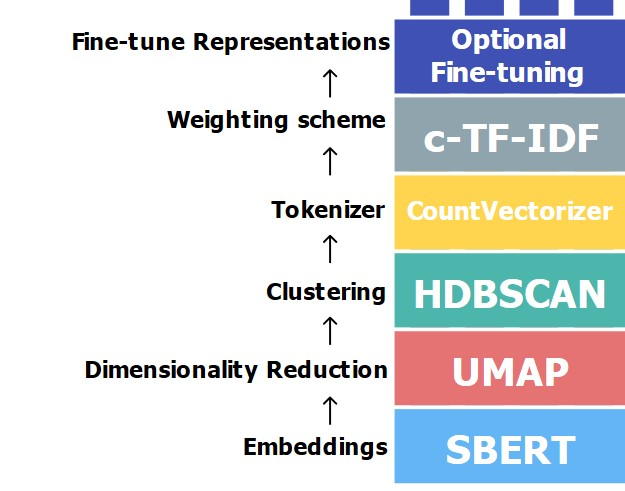

If you want to build your own topic modeling pipeline instead of relying on the default configuration, you can pass in your own components to BERTopic. In this example, the BERTopic object is initialized with:

- a custom embedding model (`embedding_model`), which transforms text into vector representations,

- a UMAP model (`umap_model`), which reduces the dimensionality of those embeddings,

- an HDBSCAN model (`hdbscan_model`), which clusters the reduced embeddings into topics.

Finally, calling `.fit(documents)` trains the pipeline on the text data stored in `documents`.

```
topic_model = BERTopic(embedding_model=embedding_model,
                      umap_model=umap_model,
                      hdbscan_model=hdbscan_model,
                      verbose=True
                      ).fit(documents, embeddings)
```



## **Embeddings**

Instead of using BERTopic's default embedding models (`all-MiniLM-L6-v2` and `paraphrase-multilingual-MiniLM-L12-v2`), we could use , several other embedding backends:

- **Sentence Transformers (SBERT)**: the default backend; we can access, use, and train sentence embedding models via [sbert.net](https://www.sbert.net/), or use pretrained models available on [Hugging Face](https://huggingface.co/models?library=sentence-transformers).
- **Flair, spaCy, Gensim, USE**: other local embedding libraries, installable as optional extras (`pip install bertopic[flair,gensim,spacy,use]`).
- **Hosted APIs (OpenAI, Cohere)**: call an external embedding endpoint instead of running a model locally, via `bertopic.backend.OpenAIBackend` / `CohereBackend`.
- **Precomputed embeddings**: generate document vectors with any method of your choice, entirely outside BERTopic, and pass them directly into `fit_transform()`.

A few things to _keep in mind_ when swapping in a different embedding backend:

- **One vector per document, not per token.** BERTopic needs a single fixed-size embedding per document. Word-embedding backends (Flair, Gensim, spaCy) need a pooling strategy to turn per-word vectors into one document-level vector; sentence-transformers and USE handle this natively.
- **Install the right extras.** Flair, Gensim, spaCy, and USE aren't installed by default: `pip install bertopic[flair,gensim,spacy,use]`.
- **`embedding_model=None` has trade-offs.** If you pass precomputed embeddings via `fit_transform(docs, embeddings=your_embeddings)` without supplying an `embedding_model`, later steps that need to embed *new* text (for example, `transform()` on unseen documents, `find_topics()`, zero-shot topic lists, or representation models like `KeyBERTInspired`) will fail or need a workaround, since there's no model left to call.
- **Embeddings must align with documents.** Precomputed embeddings must be in the exact same order as the document list passed alongside them.

In [37]:
# install in case you use sentence transformer with other models and more control
# !pip install sentence_transformers

In [ ]:
# For example, swapping in a larger, higher-quality Sentence-Transformers model instead of the default `all-MiniLM-L6-v2`:
from sentence_transformers import SentenceTransformer

embedding_model = SentenceTransformer("all-mpnet-base-v2")
topic_model_big = BERTopic(verbose=True, embedding_model=embedding_model)


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
topics, probs = topic_model_big.fit_transform(documents)

In [ ]:
topic_model_big.save("dh-dataset_big.mm")

In [60]:
topic_model_big = BERTopic.load("dh-dataset_big.mm")

## **Dimensionality Reduction**



Instead of using BERTopic's default dimensionality reduction (UMAP), several other options can be used:

- **UMAP (default)**: used with custom parameters by defining it directly and passing it via `umap_model`, e.g. `UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine')`.
- **PCA / TruncatedSVD**: faster, simpler linear alternatives from scikit-learn; useful when speed matters more than capturing complex non-linear structure.
- **Any scikit-learn-compatible reducer**: any class with `.fit()` and `.transform()` methods can be passed as `umap_model`, despite the parameter's name.
- **Skip the step entirely**: `BaseDimensionalityReduction()` performs no reduction at all, clustering directly on the full embeddings; useful when embeddings are precomputed and already low-dimensional, or with certain (semi-)supervised setups.

_Note:_
- The parameter is still called umap_model regardless of what you pass in, a naming quirk kept for backward compatibility.
- Skipping reduction with `BaseDimensionalityReduction()` means HDBSCAN clusters in the full, high-dimensional embedding space, which clustering algorithms generally handle worse. This usually only makes sense alongside a different clustering setup (e.g. a supervised classifier instead of HDBSCAN).

### **Example**: swapping UMAP for PCA to reduce embedding dimensions before clustering.


In [ ]:
from sklearn.decomposition import PCA


dim_model = PCA(n_components=5) # reduce the embedding dimensions to 5 using PCA

topic_model_pca = BERTopic(verbose=True, umap_model=dim_model)
topics, probs = topic_model_pca.fit_transform(documents)


2026-09-17 15:38:37,922 - BERTopic - Embedding - Transforming documents to embeddings.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Batches:   0%|          | 0/189 [00:00<?, ?it/s]

2026-09-17 15:40:41,145 - BERTopic - Embedding - Completed ✓
2026-09-17 15:40:41,146 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-09-17 15:40:41,194 - BERTopic - Dimensionality - Completed ✓
2026-09-17 15:40:41,196 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-09-17 15:40:41,556 - BERTopic - Cluster - Completed ✓
2026-09-17 15:40:41,560 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-09-17 15:40:46,027 - BERTopic - Representation - Completed ✓


In [ ]:
topic_model_pca.save("dh-dataset_pca.mm")

2026-09-17 17:34:44,731 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.
2026-09-17 17:34:45,608 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


### Which differences to expect (PCA instead of UMAP)

- **Faster & deterministic**: no randomness, unlike UMAP.
- **Lower quality clusters**: PCA is linear, while embeddings sit on a non-linear manifold; UMAP preserves that structure better.
- **Expect more outliers (`-1`) and blurrier topics**: HDBSCAN needs dense regions to cluster, and PCA produces a flatter point cloud than UMAP.


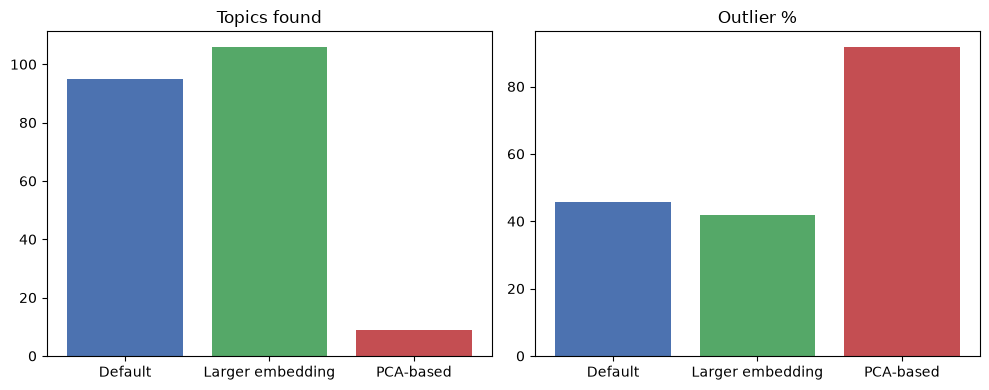

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Compare the topics generated by different BERTopic models
models = {"Default": topic_model, "Larger embedding": topic_model_big, "PCA-based": topic_model_pca}
colors = ["#4C72B0", "#55A868", "#C44E52"]

# Create a summary DataFrame containing the number of topics found and the percentage of outlier documents for each model
summary = pd.DataFrame(
    {"Model": name, "Topics found": (info["Topic"] != -1).sum(),
     "Outlier %": round(info.loc[info["Topic"] == -1, "Count"].sum() / info["Count"].sum() * 100, 1)}
    for name, model in models.items()
    for info in [model.get_topic_info()]
)
# Plot the comparison of topics found and outlier percentages for each model
fig, axes = plt.subplots(1, 2, figsize=(10, 4)) # Create a 1x2 subplot for comparison

# Iterate over the two columns ("Topics found" and "Outlier %") and plot them in the respective subplots
for ax, col in zip(axes, ["Topics found", "Outlier %"]):
    ax.bar(summary["Model"], summary[col], color=colors)
    ax.set_title(col)

plt.tight_layout()
plt.show()

## **Clustering**

Instead of using BERTopic's default clustering algorithm (HDBSCAN), several other options can be used.

Two clustering concepts worth pausing on before comparing the options:

**Density-based clustering** (what HDBSCAN does) doesn't sort documents into a fixed number of groups. Instead, it looks at how tightly packed points are in the embedding space: wherever many documents sit close together, it calls that a cluster; wherever points are spread out and isolated, it leaves them unclustered. This is why HDBSCAN can produce the `-1` "outlier" bucket. It represents a sparse, isolated document simply isn't part of any dense region, so it isn't forced into one. 

**k-Means**, by contrast, works by picking `k` cluster *centers* (centroids) and assigning every single point to whichever center is closest and then repeatedly recalculating the centers based on those assignments until they stop moving much. Two consequences follow directly from that mechanism:

**Agglomerative clustering** works bottom-up: it starts by treating every _single_ document as its own tiny cluster, then repeatedly merges the two closest clusters into one, over and over, until only one giant cluster remains containing everything. The result of this process is a **dendrogram** (a tree structure recording every merge, in order, from individual documents up to the whole corpus). To get actual topics out of it, you cut that tree at some level: cutting near the top yields a few broad clusters, cutting lower down yields many narrow ones.

![Clustering Algorithms](<Clustering Algorithms.png>)

**Choosing a clustering algorithm: key considerations**

- **Does it need a target number of clusters?** k-Means and Agglomerative both require deciding this in advance (e.g., where to cut Agglomerative's dendrogram); HDBSCAN discovers the number of clusters automatically from where documents are actually dense.
- **Does every document get assigned somewhere?** k-Means forces every document into its nearest cluster, no matter how unrelated it is, so it never produces outliers. HDBSCAN leaves genuinely isolated documents unclustered in the `-1` bucket rather than forcing a bad fit. Agglomerative also assigns every point once you cut the tree, similar to k-Means in that respect.
- **What shape of result do you get?** HDBSCAN and k-Means each produce one flat, final partition of documents into clusters. Agglomerative instead preserves the full hierarchy of merges, so you can inspect which documents grouped together first (most similar) versus only near the top (least similar); this can be useful if nested sub-themes matter more than a single flat list.
- **What do you actually know about your corpus going in?** If you have no idea how many themes it contains and trust the data to reveal its own structure, HDBSCAN fits best. If you already have a target number of topics (e.g. matching a coding scheme or a fixed set of conference tracks), k-Means fits best. If you expect broad themes that further split into sub-themes, Agglomerative fits best.

- **HDBSCAN (default)**: density-based; finds clusters of varying shapes and densities, and produces the `-1` outlier bucket for documents that don't fit anywhere.
- **k-Means**: forces every document into one of `k` clusters, so no outliers are produced; trade-off is that noisy or ambiguous documents get forced into a topic anyway, which can weaken topic representations.
- **Agglomerative Clustering**: hierarchical, useful when a nested/tree-like topic structure fits the corpus better than flat clusters.
- **Any scikit-learn-compatible model**: any class with `.fit()` and `.predict()` (and a `.labels_` attribute) can be passed as `hdbscan_model`, despite the parameter's name.

In [66]:
from sklearn.cluster import KMeans

cluster_model = KMeans(n_clusters=15)
topic_model_kmeans = BERTopic(hdbscan_model=cluster_model)

topics, probs = topic_model_kmeans.fit_transform(documents)
topic_model_kmeans.save("dh-dataset_kmeans.mm")

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

2026-09-17 17:48:26,462 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


In [70]:
# see the topics
topic_model_kmeans.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,551,0_the_and_of_to,"[the, and, of, to, in, for, digital, as, is, d...",[Overview The digitization of cultural heritag...
1,1,526,1_the_of_and_in,"[the, of, and, in, to, that, is, for, as, we]",[Introduction The methodical discussions on di...
2,2,524,2_the_of_to_and,"[the, of, to, and, in, is, for, as, that, we]",[Structuring large historical corpora that are...
3,3,504,3_the_and_of_to,"[the, and, of, to, in, digital, humanities, th...",[In the AIUCD ( Associazione per l'Informatica...
4,4,476,4_the_of_to_and,"[the, of, to, and, in, for, is, as, that, be]","[The theme of this conference is complexities,..."
5,5,443,5_the_and_of_to,"[the, and, of, to, data, in, for, research, is...","[Introduction For quite some time, humanities ..."
6,6,424,6_the_of_and_in,"[the, of, and, in, to, for, as, is, on, this]",[A collaboration between the National Archives...
7,7,389,7_the_and_of_to,"[the, and, of, to, in, for, as, is, that, with]",[Introduction Information about place is an es...
8,8,387,8_the_of_and_to,"[the, of, and, to, in, for, is, as, text, on]",[1. The goal of the Bibliothèques Virtuelles H...
9,9,342,9_the_of_in_and,"[the, of, in, and, to, is, that, for, words, as]",[This paper stems from the analysis of multipl...


**Why do all the topics look the same... and why is it worse than the default run?**

Every topic's top words here are the same handful of function words (`the`, `of`, `and`, `to`). This is a sign the vectorizer never filtered common words before c-TF-IDF scored them. That step was missing from the default HDBSCAN run too, but it showed up far less there, because of *what* each algorithm was allowed to produce.

HDBSCAN only forms a cluster where documents are genuinely dense, pushing everything else into the `-1` outlier bucket, so its surviving clusters are small and thematically tight, letting a handful of real content words concentrate enough to outrank generic ones. k-Means has no such safety valve: forced into exactly 15 similarly-sized clusters, it lumps together documents that aren't actually alike, producing large, heterogeneous groups with no dominant theme strong enough to beat out function words.

**The fix** is the same either way: pass a `vectorizer_model` with `stop_words="english"` so common words are filtered before c-TF-IDF runs. But _note that_ k-Means' forces evenly-sized partitioning which makes it more vulnerable to this missing step than HDBSCAN was.

## **Tokenizer**

A **tokenizer** is whatever splits a string of text into the discrete units ("tokens") that get counted and analyzed. A token is _usually_ a word, but **not always**. This sounds like a trivial step, but the "obvious" way to split text (on whitespace and punctuation) makes real assumptions: it assumes words are separated by spaces, that a word's boundaries are unambiguous, and that meaningful units are single words rather than short phrases. None of that holds universally. Chinese text has no spaces between words at all, "digital humanities" arguably means more as a two-word unit than as "digital" and "humanities" separately, and a corpus full of file extensions, citations, or code snippets tokenizes very differently than a corpus full of essays. That's why several tokenizer options exist: the right one depends on your language, your domain, and what counts as a meaningful "word" in your specific corpus. If you get it wrong, every downstream step (from counting to scoring to labeling) inherits that mistake.

In BERTopic, this stage sits right after clustering: once documents have been grouped into topics, BERTopic needs to turn the raw text of each topic's documents into countable tokens before it can score which ones are distinctive (that scoring happens in the next stage, c-TF-IDF). This is done with a `CountVectorizer`, which tokenizes text and counts how often each token appears. This is the same bag-of-words idea from the LDA comparison earlier, but applied *within* each already-formed cluster rather than used to form the clusters themselves.

Instead of using BERTopic's default tokenizer configuration (a bare `CountVectorizer`), it can be tuned or replaced entirely.

**Parameters on `CountVectorizer` itself:**
- **`stop_words`**: removes common words before c-TF-IDF runs, see below with `stop_words="english"`.
- **`ngram_range`**: controls how many tokens make up each keyword, e.g. `ngram_range=(1, 2)` allows two-word phrases (bigrams) like `"digital humanities"` alongside single words.
- **`min_df` / `max_df`**: filters out words that are too rare or too common across documents, keeping the resulting vocabulary manageable.

**Swapping in a different implementation:**
- **A custom `tokenizer` function** can passed into `CountVectorizer(tokenizer=...)` to replace its default word-splitting logic entirely; needed for languages it doesn't handle well (e.g. Chinese), or for filtering n-grams by part-of-speech pattern using spaCy, to avoid nonsense bigrams slipping through.

In [71]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 2))
topic_model_vectorizer = BERTopic(vectorizer_model=vectorizer_model)

topics, probs = topic_model_vectorizer.fit_transform(documents)

# save the model
topic_model_vectorizer.save("topic_model_vectorizer.mm")

# show the topics
topic_model_vectorizer.get_topic_info()

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

2026-09-17 18:06:30,692 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


,Topic,Count,Name,Representation,Representative_Docs
0,-1,2630,-1_digital_data_research_humanities,"[digital, data, research, humanities, text, pr...",[This panel describes work that has been and i...
1,0,144,0_image_images_visual_art,"[image, images, visual, art, al, et al, et, vi...",[Overview Visual culture is often overlooked a...
2,1,140,1_tei_xml_markup_document,"[tei, xml, markup, document, encoding, text, e...",[TEI Simple is a Mellon-funded project develop...
3,2,139,2_maps_map_spatial_gis,"[maps, map, spatial, gis, place, historical, p...",[Introduction Given the rise in recent years o...
4,3,116,3_authorship_words_attribution_delta,"[authorship, words, attribution, delta, author...","[1. Introduction For nearly a decade, Brian Vi..."
...,...,...,...,...,...
90,89,12,89_computing_humanities computing_busa_humanities,"[computing, humanities computing, busa, humani...",[How can digital methods be used to conceptual...
91,90,12,90_legal_copyright_protection_rights,"[legal, copyright, protection, rights, data, r...",[Despite the fact that the first copyright act...
92,91,11,91_tools_voyant_tapor_portal,"[tools, voyant, tapor, portal, tool, spyral, t...",[Voyant Tools (voyant-tools.org) is a web-base...
93,92,11,92_bamboo_humanities_digital_infrastructure,"[bamboo, humanities, digital, infrastructure, ...",[This pre-conference workshop aims to bring to...


This is a dramatic improvement over the k-Means run. The topic names are genuinely interpretable now (`tei_xml_markup_document`, `maps_map_spatial_gis`, `authorship_words_attribution_delta`, `tools_voyant_tapor_portal`), thanks to stopword removal and bigrams surfacing real DH terminology instead of function words.

_Note that_: there are **95 topics, with a long tail of very small ones** (many down to 10–12 documents by the end of the table). HDBSCAN finds clusters wherever density exists, even niche ones. This can be useful for surfacing specific subfields, but likely more topics than you'd want to present as-is; a good candidate for `reduce_topics()` if a shorter, broader list is the goal.

## **Weighting Scheme**

The **Weighting scheme** stage decides which of the tokenized words from the previous step actually get treated as distinctive of a topic. Simple word counts aren't enough on their own since the word "the" might appear far more often than "manuscript" in every topic, but that doesn't make it more informative about what the topic is *about*. This is the same problem stopword removal patches at the vectorizer stage. Weighting handles it mathematically instead, by scoring each word based on how concentrated it is in one topic relative to how it's spread across all the others.

BERTopic does this with **c-TF-IDF** (class-based TF-IDF): it treats each entire topic cluster as if it were one merged document, then scores each word by how distinctive it is to that "document" compared to all other topics combined. A word that's common everywhere gets a low score no matter how often it appears; a word concentrated in just one topic gets a high score even if its raw count is modest.

Why would you need to adjust this scoring at all, rather than trusting the default formula? Because "distinctive" isn't always well-calibrated out of the box. Some words are frequent across *every* topic without being classic stopwords (jargon like "paper," "research," or "study" in an academic corpus), and the default formula can still let them dominate.

**Parameters on `ClassTfidfTransformer`** (BERTopic's default weighting class):
- **`bm25_weighting`**: swaps in a BM25-style formula for computing word importance, one that tends to be more robust to leftover stopword-like noise, especially on smaller datasets.
- **`reduce_frequent_words`**: dampens the influence of words that occur very often across topics (like "paper" or "research" in an academic corpus), even when they aren't part of a standard stopword list.


In [72]:
from bertopic.vectorizers import ClassTfidfTransformer

ctfidf_model = ClassTfidfTransformer(bm25_weighting=True, reduce_frequent_words=True)
topic_model_ctidf = BERTopic(verbose=True, ctfidf_model=ctfidf_model)

topics, probs = topic_model_ctidf.fit_transform(documents)

# save the model
topic_model_ctidf.save("topic_model_ctidf.mm")

# show the topics
topic_model_ctidf.get_topic_info()

2026-09-17 18:25:16,217 - BERTopic - Embedding - Transforming documents to embeddings.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Batches:   0%|          | 0/189 [00:00<?, ?it/s]

2026-09-17 18:27:18,733 - BERTopic - Embedding - Completed ✓
2026-09-17 18:27:18,734 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-09-17 18:27:19,962 - BERTopic - Dimensionality - Completed ✓
2026-09-17 18:27:19,963 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-09-17 18:27:20,147 - BERTopic - Cluster - Completed ✓
2026-09-17 18:27:20,150 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-09-17 18:27:24,508 - BERTopic - Representation - Completed ✓
2026-09-17 18:27:27,107 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


,Topic,Count,Name,Representation,Representative_Docs
0,-1,2746,-1_cultural_language_tools_new,"[cultural, language, tools, new, resources, pr...",[New and recent developments in image analysis...
1,0,157,0_maps_huiguan_spatial_map,"[maps, huiguan, spatial, map, gis, beijing, ge...",[The Spatial Humanities (SH) is a discipline t...
2,1,140,1_tei_xml_markup_odd,"[tei, xml, markup, odd, encoding, xslt, docume...","[By ""hermeneutic"" markup I mean markup that is..."
3,2,127,2_authorship_delta_attribution_zeta,"[authorship, delta, attribution, zeta, burrows...",[The aim of this study is to find a minimal si...
4,3,108,3_poetry_rhyme_poetic_poems,"[poetry, rhyme, poetic, poems, poem, metrical,...",[Introduction The influence of poetic form on ...
...,...,...,...,...,...
85,84,11,84_tapor_portal_dystopian_tools,"[tapor, portal, dystopian, tools, trex, tool, ...","[In recent years, the term tool criticism foun..."
86,85,11,85_zoetrope_video_television_bbc,"[zoetrope, video, television, bbc, bandera, dv...",[A large number of digital humanities projects...
87,86,10,86_busa_computing_busas_computers,"[busa, computing, busas, computers, ibm, lciks...",[Who undertook the foundational work of the di...
88,87,10,87_constructivist_lab_dh_secularization,"[constructivist, lab, dh, secularization, subj...",[Panel Abstract Recent years have seen humanit...


## **Fine-Tune Representations**

The **Fine-tune Representations** stage is the final, optional step in the pipeline: it takes the keyword list c-TF-IDF already produced for each topic and refines or replaces it, without touching the clustering underneath. Why bother, if c-TF-IDF already gives you a ranked word list? Because c-TF-IDF only scores individual words statistically; it has no sense of grammar, redundancy, or narrative: it might rank `"digital"`, `"digitally"`, and `"digitization"` all highly for the same topic (near-redundant), or surface a verb fragment that reads oddly out of context. This stage exists to layer smarter, sometimes genuinely different techniques on top of that raw statistical ranking, and unlike the Weighting scheme stage, it's genuinely a marketplace of interchangeable techniques, several of them completely different in kind from each other.

**Parameters within a given representation model:**
- **`MaximalMarginalRelevance` (`diversity=`)**: re-ranks the existing c-TF-IDF keyword list to reduce redundancy, so you get `digital`, `manuscript`, `archive` rather than `digital`, `digitally`, `digitization`.
- **`KeyBERTInspired` (`top_n_words=`)**: re-scores keywords by how semantically close each word's *own embedding* is to the topic's overall embedding, rather than by raw c-TF-IDF frequency alone, closer to how BERTopic already thinks about documents.

**Swapping in a completely different implementation:**
- **`PartOfSpeech`**: uses spaCy's grammatical tagging to restrict keywords to sensible word types (e.g. noun phrases only), avoiding fragments that read oddly out of context.
- **`ZeroShotClassification`**: matches each topic against a list of candidate labels *you* supply, assigning one if it's a close enough semantic fit, and falling back to the ordinary c-TF-IDF keywords otherwise.
- **`OpenAI` / `Cohere` / `LangChain` / `LiteLLM` / `LlamaCPP` / `TextGeneration`**: hands the topic's keywords and a few representative documents to a language model (hosted or local) and asks it to generate a short, human-readable label or summary, instead of a bare keyword list.

Prerequisites:
- The LLM-based options require API access (and cost, for hosted ones) or a locally downloaded model (for `LlamaCPP`), plus a prompt template that inserts the topic's `[KEYWORDS]` and `[DOCUMENTS]`.

Example: diversifying keywords, then generating a short label with an LLM.

```python
from bertopic.representation import MaximalMarginalRelevance, OpenAI
from bertopic import BERTopic
import openai

mmr_model = MaximalMarginalRelevance(diversity=0.3)
client = openai.OpenAI(api_key="sk-...")
prompt = "These documents share these keywords: [KEYWORDS]\n\nDocuments:\n[DOCUMENTS]\n\nGive this topic a short, human-readable label in the format: topic: <label>"
openai_model = OpenAI(client, model="gpt-3.5-turbo", chat=True, prompt=prompt)

topic_model = BERTopic(representation_model=[mmr_model, openai_model])
topics, probs = topic_model.fit_transform(documents)

topic_model.get_topic_info()  # the Name column now holds OpenAI's generated labels
```

Example: chaining `KeyBERTInspired` and `MaximalMarginalRelevance` on the DH abstracts. `KeyBERTInspired` re-scores each topic's keywords by semantic closeness first, then `MaximalMarginalRelevance` re-ranks that list to cut redundancy.

In [ ]:
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance

keybert_model = KeyBERTInspired() # Initialize the KeyBERT-inspired representation model
mmr_model = MaximalMarginalRelevance(diversity=0.3) # Initialize the Maximal Marginal Relevance representation model

topic_model_keybert = BERTopic(representation_model=[keybert_model, mmr_model])
topics, probs = topic_model_keybert.fit_transform(documents)

# save the model
topic_model_keybert.save("topic_model_keybert.mm")

# show the topics
topic_model_keybert.get_topic_info()

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

2026-09-17 18:30:40,221 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


,Topic,Count,Name,Representation,Representative_Docs
0,-1,2727,-1_humanities_scholars_digital_research,"[humanities, scholars, digital, research, text...",[Bringing together researchers from a wide var...
1,0,149,0_geographic_geospatial_geographical_geography,"[geographic, geospatial, geographical, geograp...",[Introduction Information about place is an es...
2,1,137,1_markup_texts_documentation_document,"[markup, texts, documentation, document, text,...",[The Shakespeare Quartos Archive will make ava...
3,2,126,2_humanities_pedagogy_pedagogical_academic,"[humanities, pedagogy, pedagogical, academic, ...",[In the summer 2014 issue of CEA Critic author...
4,3,115,3_authorship_corpus_stylistic_texts,"[authorship, corpus, stylistic, texts, attribu...",[In the house of non-traditional authorship at...
...,...,...,...,...,...
85,84,11,84_texts_tools_usability_text,"[texts, tools, usability, text, tool, corpus, ...",[The most extensive compendium of text mining ...
86,85,11,85_soviet_ussr_repressions_russian,"[soviet, ussr, repressions, russian, repressio...","[This Today, relations between Russia, on the ..."
87,86,11,86_literary_literariness_novels_readers,"[literary, literariness, novels, readers, nove...",[Our poster introduces an R package with a var...
88,87,10,87_irish_ulster_ireland_1916,"[irish, ulster, ireland, 1916, novels, angloir...",[The Letters of 1916 is Ireland’s first public...


Example: an LLM-generated label. Running an LLM-based representation model needs API access, so instead of fitting live, this loads a model that was already fit once with `MaximalMarginalRelevance` chained into `LiteLLM` (using Claude) as its `representation_model`. Its `Name` column holds the short label the LLM generated for each topic, in place of a raw keyword list.

In [ ]:
from bertopic.representation import MaximalMarginalRelevance, LiteLLM

"""
configurations of the model:
mmr_model = MaximalMarginalRelevance(diversity=0.3)
claude_model = LiteLLM(model="anthropic/claude-haiku-4-5-20251001")
"""
# load the model
topic_model_claude = BERTopic.load("topic_model_claude.mm")

# show the topics
topic_model_claude.get_topic_info()

2026-09-17 18:42:29,300 - BERTopic - Embedding - Transforming documents to embeddings.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Batches:   0%|          | 0/189 [00:00<?, ?it/s]

2026-09-17 18:44:29,374 - BERTopic - Embedding - Completed ✓
2026-09-17 18:44:29,376 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-09-17 18:44:30,408 - BERTopic - Dimensionality - Completed ✓
2026-09-17 18:44:30,410 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-09-17 18:44:30,636 - BERTopic - Cluster - Completed ✓
2026-09-17 18:44:30,641 - BERTopic - Representation - Fine-tuning topics using representation models.
100%|██████████| 90/90 [01:11<00:00,  1.26it/s]
2026-09-17 18:45:52,800 - BERTopic - Representation - Completed ✓
2026-09-17 18:45:55,190 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


,Topic,Count,Name,Representation,Representative_Docs
0,-1,2735,-1_Digital Humanities Research and Methods,[Digital Humanities Research and Methods],[Both the relational database model and the do...
1,0,155,0_Spatial Humanities and Digital Mapping,[Spatial Humanities and Digital Mapping],[Introduction Information about place is an es...
2,1,149,1_Computational Methods for Analyzing Semantic...,[Computational Methods for Analyzing Semantic ...,"[Introduction In the last decades, quantitativ..."
3,2,135,2_TEI Text Encoding and XML Markup for Digital...,[TEI Text Encoding and XML Markup for Digital ...,[The Shakespeare Quartos Archive will make ava...
4,3,114,3_Visual Image Analysis in Digital Humanities,[Visual Image Analysis in Digital Humanities],[Image analysis is increasingly central to the...
...,...,...,...,...,...
85,84,12,84_Letters of 1916: Digital Humanities and the...,[Letters of 1916: Digital Humanities and the I...,[Letters of 1916 is Ireland’s first digital pu...
86,85,12,85_Literary Quality Perception in Dutch Novels,[Literary Quality Perception in Dutch Novels],[Our poster introduces an R package with a var...
87,86,12,86_History of Computing in the Humanities and ...,[History of Computing in the Humanities and Di...,[How can digital methods be used to conceptual...
88,87,12,"87_Memory, Repression, and Collective Trauma i...","[Memory, Repression, and Collective Trauma in ...","[This Today, relations between Russia, on the ..."


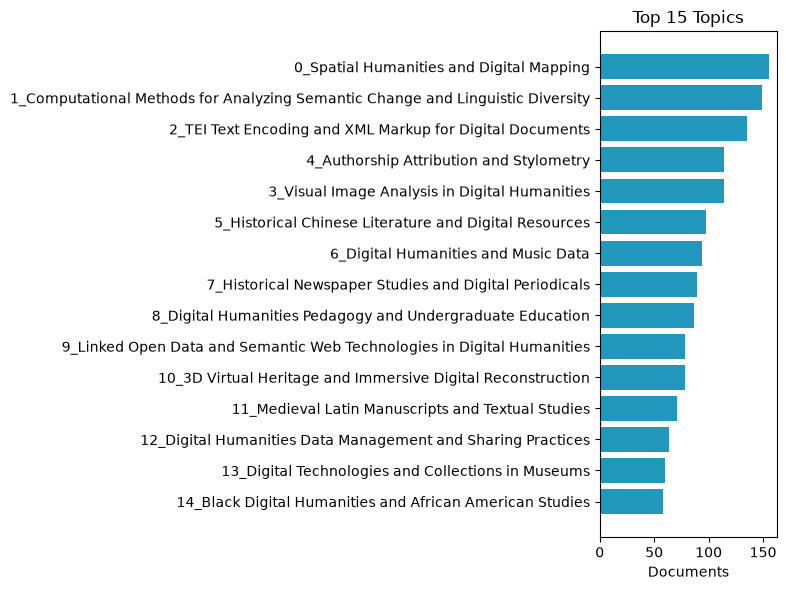

In [23]:
import matplotlib.pyplot as plt

info = topic_model_claude.get_topic_info()
top15 = info[info["Topic"] != -1].nlargest(15, "Count").sort_values("Count")

plt.figure(figsize=(8, 6))
plt.barh(top15["Name"], top15["Count"], color="#2197bb")
plt.xlabel("Documents")
plt.title("Top 15 Topics")
plt.tight_layout()
plt.show()